# Visión por Computador - Práctica 3 - Extracción (y Emparejamiento) de Características y Registrado de Imágenes

#### 11 puntos   |   Fecha de entrega: 31 de Diciembre, 23:59   |   Forma de entrega: a través de la tarea creada en https://pradogrado2425.ugr.es/

### Estudiante: <mark>Eduardo Rodríguez Cao</mark>



<font color='blue'>En esta práctica aprenderás:

<font color='blue'>a) A detectar puntos de interés utilizando el detector de esquinas de Harris (Ejercicio 1).

<font color='blue'>b) A encontrar correspondencias entre los _keypoints_ (puntos de interés) de dos imágenes utilizando distintos descriptores (Ejercicio 2).

<font color='blue'>c) A componer un mosaico/panorama a partir de un conjunto de imágenes utilizando homografías (Ejercicio 3).

# **Funciones auxiliares**

In [ ]:
# Let's start importing all background modules
# We start by getting access to the drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
import sys,os
# change directory
%cd '/content/drive/My Drive'
# Let's import the python module exercises.py  to have access to its functions and Classes
get_image = lambda route: os.path.join('/content/drive/MyDrive/images/', route)
import numpy as np
from matplotlib import pyplot as plt
import cv2

Mounted at /content/drive
/content/drive/My Drive


In [ ]:
'''
This function receives a string with the filename of the image to read,
and a flag indicating if we want to read it in color/RGB (flagColor=1) or gray level (flagColor=0)

Example of use:
im1=readIm(get_image('apple.jpg'),0)

'''
def readIm(filename, flagColor=1):
  # cv2 reads BGR format
  im=cv2.imread(filename)
  # change to  RGB and return the image
  if(flagColor):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  # change from BGR to grayscale instead if flag is 0
  return cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

In [ ]:
'''
This function receives an array of arbitrary real numbers (that could include even negative values),
and returns an 'image' in the range [0,1].
flag_GLOBAL allows the user to normalize the whole image (including all channels) or to normalize
each channel/band independently.
'''
def rangeDisplay01(im, flag_GLOBAL= True):
  im = im.astype(float)
  if flag_GLOBAL:
    im = (im - im.min())/(im.max() - im.min())
  else:
    # bands normalization
    for band in range(im.shape[2]):
      im[:, :, band] = (im[:, :, band] - im[:, :, band].min())/(im[:, :, band].max() - im[:, :, band].min())
      # Note: remember that, for plt.imshow with RGB data, the valid range is [0..1] for floats and [0..255] for integers.
  return im

In [ ]:
'''
This function displays a single image, including a title, using a magnification factor.

Example of use:
im1=readIm(get_image('apple.jpg'),0)
displayIm(im1,'Manzana',0.5)

'''
def displayIm(im, title='Result',factor= 2):
  # First normalize range
  max=np.max(im)
  min=np.min(im)
  if min<0 or max>255:
    im=rangeDisplay01(im,flag_GLOBAL=True)
  if len(im.shape) == 3:
    # im es tribanda
    plt.imshow(im, cmap='jet')
  else:
    # im es monobanda
    plt.imshow(im, cmap='gray')
  figure_size = plt.gcf().get_size_inches()
  plt.gcf().set_size_inches(factor * figure_size)
  plt.title(title)
  plt.xticks([]), plt.yticks([]) # eliminamos numeración
  plt.show()

In [ ]:
'''
This function displays multiple images (including a title and using a magnification factor)
of equal size. The input to the function is a list of images.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1,im1,im1]

displayMI_ES(images, title='Manzanas',factor=1)

'''
def displayMI_ES(vim, title='Result',factor=2):
  # We set the maximun number of images to concatenate by columns
  maxcolumns=3
  # number of images to display
  numberim=len(vim)
  # The simplest case, one row: the maximum number of columns is larger than the images to stack
  # This is, by default, we put together the images column-wise
  if len(vim) < maxcolumns:
    out=vim[0]
    for item in range(1,len(vim)):
      #displayIm(out,str(item),1)
      out=np.hstack((out,vim[item]))

  # Else, if maxcolumns is smaller or equal than the number of images to stack
  else:
    # We check if all rows and columns are going to be 'busy', or if otherwise we need an extra-row
    if np.mod(len(vim),maxcolumns)== 0:
      maxrows=numberim//maxcolumns
    else:
      maxrows=numberim//maxcolumns+1

    # we build up the first block-row
    out=vim[0]
    for item in range(1,maxcolumns):
      out=np.hstack((out,vim[item]))
    # We build up the rest of block-rows
    for block in range(1,maxrows):
      #print(block)
      row=vim[block*maxcolumns]
      for item in range(1,maxcolumns):
        # We still have images to stack
        if block*maxcolumns+item < numberim:
          row=np.hstack((row,vim[block*maxcolumns+item]))
        # We do not have more images, and we have to fill with black
        else:
          row=np.hstack((row,np.zeros(vim[0].shape,dtype=vim[0].dtype)))
          #print(row.dtype)
          # if we don't include ',dtype=vim[0].dtype', np.zeros will include float
          # numbers in the matrix. This will make that the whole matrix will be
          # considered as floats, and values larger than 1 will be clipped to 1,
          # displaying an almost totally white image
      # add the new block-row
      out=np.vstack((out,row))
  return displayIm(out,title,factor)

In [ ]:
# Here you include your functions from P1

def GaussFunc(x,sigma):
    # Esta función calcula la función Gaussiana, ignorando constante de normalización
    return np.exp(-x**2/(2*sigma**2))

def GaussDeriv1Func(x,sigma):
    # Esta función calcula la primera derivada de la Gaussiana
    return (-x/sigma**2) * GaussFunc(x,sigma)

def GaussDeriv2Func(x,sigma):
    # Esta función calcula la segunda derivada de la Gaussiana
    return (x**2/sigma**4 - 1/sigma**2) * GaussFunc(x,sigma)

def Mask2Sigma(sizeMask):
    # Esta función calcula el sigma a partir del tamaño de la máscara
    return (sizeMask - 1)/6

def Sigma2Mask(sigma):
    # Esta función calcula el tamaño de la máscara a partir del sigma
    return int(2*np.floor(3*sigma)+1)

def gaussianMask1D(sigma=0, sizeMask=0, order=0):
    '''
    Esta función calcula la máscara Gaussiana dados el sigma,
    el tamaño de la máscara y el órden. Siempre tiene que recibir
    o un sigma, o el tamaño de la máscara
    '''
    # order = 0 -> función Gaussiana
    # order = 1 -> derivada de la Gaussiana
    # order = 2 -> derivada segunda de la Gaussiana

    # Comprobaciones
    assert sigma or sizeMask
    assert order in [0,1,2]
    assert sigma >= 0 and sizeMask >= 0

    # Deducimos los parámetros
    if sigma == 0:
        sigma = Mask2Sigma(sizeMask)
    elif sizeMask == 0:
        sizeMask = Sigma2Mask(sigma)

    # Calculamos k a partir del tamaño de la máscara
    k = (sizeMask-1)//2  # División entera

    # Calculamos máscara según el órden
    if order == 0:
        # Máscara usando list comprehension y creando array de numpy
        mask = np.array([GaussFunc(i, sigma) for i in range(-k, k+1)])
        # Calculamos suma y normalizamos
        suma = sum(mask)
        mask = mask/suma
    elif order == 1:
        mask = np.array([sigma*GaussDeriv1Func(i, sigma) for i in range(-k, k+1)])
    elif order == 2:
        mask = np.array([sigma**2 * GaussDeriv2Func(i, sigma) for i in range(-k, k+1)])

    return mask

In [ ]:
def my2DConv(im, sigma, orders):
  '''
  Esta función recibe una imagen, un sigma y los órdenes de las derivadas
  gaussianas (o de la gaussiana) que se aplican a las filas y las columnas,
  devolviendo la imagen convolucionada
  '''
  # Calculamos máscaras con la función del apartado 1.A
  ddepth = cv2.CV_64F
  mask0 = gaussianMask1D(sigma, order=0)
  mask1 = gaussianMask1D(sigma, order=1)
  mask2 = gaussianMask1D(sigma, order=2)

  # Convolucionamos
  if orders==[0,0]: # Suavizado Gaussiano
    return cv2.sepFilter2D(im, ddepth, mask0, mask0)
  elif orders==[1,0]: # Primera derivada Gaussiana en X
    return cv2.sepFilter2D(im, ddepth, mask1, mask0)
  elif orders==[0,1]: # Primera derivada Gaussiana en Y
    return cv2.sepFilter2D(im, ddepth, mask0, mask1)
  elif orders==[2,0]: # Segunda derivada Gaussiana en X
    return cv2.sepFilter2D(im, ddepth, mask2, mask0)
  elif orders==[0,2]: # Segunda derivada Gaussiana en Y
    return cv2.sepFilter2D(im, ddepth, mask0, mask2)
  else:
    print('error in order of derivative')

# <font color='blue'>**Ejercicio 1:** Harris Corner Detector (3 puntos)

<font color='blue'>Implementar la detección de los 450-500 puntos Harris más fuertes en una imagen (es decir, como mínimo, se deben detectar/mostrar 450 puntos de interés y como máximo 500). Los pasos para implementar el detector de esquinas de Harris son los siguientes: \

> <font color='blue'>a) Fijar las escalas de diferenciación ($\sigma_D$) e integración ($\sigma_I$) en 1.5 y 2.25, respectivamente (aunque también se pueden emplear otros valores de sigma si el estudiante considera que mejoran el rendimiento; esto habría que justificarlo adecuadamente).

> <font color='blue'>b) Calcular las derivadas de la imagen. Para ello, se valorará positivamente el emplear las funciones creadas por el propio alumnado (en lugar de emplear directamente _cv2.getDerivKernels()_, _cv2.GaussianBlur()_, _cv2.filter2D()_ y similares).

> <font color='blue'>c) Calcular los tres términos de la _Second Moment Matrix_ ($SMM$) en cada píxel. Para ello, aplicar convolución con una máscara gaussiana con $\sigma_I$.

> <font color='blue'>d) A partir de la $SMM$, calcular el valor de Harris en cada píxel de la imagen.

> <font color='blue'>e) Aplique la supresión de no máximos mediante la función `corner_peaks()` (https://scikit-image.org/docs/stable/api/skimage.feature.html#skimage.feature.corner_peaks) del módulo `skimage.features`. El estudiante debe seleccionar una `min_distance` adecuada (`The minimal allowed distance separating peaks`) y un umbral de respuesta adecuado en el mapa de Harris para mantener solo la cantidad de _keypoints_ que se solicitan en el enunciado. El resultado será una lista de coordenadas $(x,y)$. Extraiga los valores en estas coordenadas y cree una lista de vectores $(x,y,value)$.

> <font color='blue'>f) Calcule la orientación principal para cada punto. Esto se hace suavizando ambas imágenes derivadas con un sigma suficientemente grande ($\sigma=3$) y, a continuación, calculando la orientación del gradiente en esos puntos.

> <font color='blue'>g) Cree una lista de _keypoints_ usando los puntos seleccionados. Un _keypoint_ suele representarse como un vector que incluye distintos elementos, por ejemplo, $(x,y,scale,orientation)$. En nuestro caso, un _keypoint_ es una estructura de OpenCV (`cv2.KeyPoint`), asociada a cada región detectada, que contendrá las coordenadas $x$ e $y$ del _keypoint_, así como su tamaño ($size$, es decir, el diámetro con el que se va a mostrar) y su orientacion ($angle$, calculada en el paso anterior). El parámetro $size$ de _KeyPoint()_, es decir, el diámetro del _keypoint_ mostrado, debe ser suficientemente grande como para ser visualizado adecuadamente. Una posibilidad es emplear `size=4*np.floor(3*sigmaI)+1`

> <font color='blue'>h) Dibuje los puntos sobre la imagen de entrada usando la función `drawKeyPoints()` (https://docs.opencv.org/4.x/d4/d5d/group__features2d__draw.html#ga5d2bafe8c1c45289bc3403a40fb88920), y los _flags_ `cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG+cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS`.

<font color='blue'>Se deben calcular los puntos de Harris sobre la imagen `IMG_20220312_102944_S.jpg`, y se debe mostrar:
* <font color='blue'>El mapa de respuestas de Harris (valor de Harris) en cada píxel de la imagen,
* <font color='blue'>el mapa de Harris umbralizado, es decir, una vez aplicado supresión de no máximos y un umbral mínimo de respuesta adecuado para obtener el número de puntos de interés solicitados,
* <font color='blue'>y la imagen de entrada con los keypoints finales, junto con el número exacto de _keypoints_ detectados (es decir, es necesario hacer un `print()` con el número de puntos de Harris).





El detector de esquinas de Harris es un algoritmo para detectar esquinas, es decir puntos de la imagen con variaciones significativas de intensidad en todas las direcciones (en regiones planas no hay variación, y en bordes solo en una dirección). El detector de Harris se basa en el cálculo de la SMM(Second Moment Matrix), definida a partir de las derivadas de la imagen en $x$ e $y$ con un suavizado gaussiano aplicado (en nuestro caso). Se define como:
$$H = \left( \begin{array}{cc}
\sum_{W} w(x,y) \partial I_{x}^2 & \sum_{W} w(x,y) \partial I_{x} \partial I_{y} \\
\sum_{W} w(x,y)  \partial I_{x} \partial I_{y} & \sum_{W} w(x,y) \partial I_{y}^2
\end{array} \right)
$$
Donde $\partial I_{x}$ y $\partial I_{y}$ son las derivadas parciales en $x$ e $y$ y $\sum_{W} w(x,y)$ es un suavizado gaussiano de sigma $\sigma_{I}$.

A partir de la SMM calculamos el mapa de Harris, que en nuestro caso se define como $f_{H} = \frac{det(H)}{trace(H)}$. Existen otras definiciones, nosotros usaremos esta. Este mapa de Harris nos proporciona una medida de "cornerness", es decir nos dice cómo de fuerte es la esquina.

A partir de este mapa haríamos supresión de no máximos, obteniendo esquinas más fuertes y extraemos los keypoints deseados.

Calculamos las derivadas usando nuestra función `my2DConv()` y el mapa de Harris a partir de las derivadas, usando la matriz de SMM y la definición de valor de Harris.

In [ ]:
# Compute image derivatives
def derivatives(im,sigmaD):
  dx = my2DConv(im,sigmaD,[1,0])  # Derivada en X
  dy = my2DConv(im,sigmaD,[0,1])  # Derivada en Y
  return dx,dy

# Compute Harris-criterium Map
def HarrisMap(dx,dy,sigmaI):
  h11 = my2DConv(dx**2, sigmaI, [0,0])  # Elemento h11 de la SMM H
  h22 = my2DConv(dy**2, sigmaI, [0,0])  # Elemento h22 de la SMM H
  h12 = my2DConv(dx*dy, sigmaI, [0,0])  # Elemento h12/h21 de la SMM H

  detH   = h11*h22-h12**2  # Determinante de la SMM
  traceH = h11+h22         # Traza de la SMM

  # Mapa de Harris
  HMap = detH/traceH
  return HMap

Definimos la supresión de no máximos a partir del mapa de Harris, la distancia mínima entre keypoints y el umbral. Usamos `corner_peaks` tal y como se pide. Para el umbral, usamos el parámetro `threshold_abs` que es más cómodo que `threshold_rel`, ya que podemos ajustar manualmente el umbral para obtener el número de keypoints deseados más fácilmente.

In [ ]:
def NonMaximaSuppression(harrisMap, min_distance, threshold):
  # Supresión con corner_peaks
  peaks = corner_peaks(harrisMap, min_distance=min_distance, threshold_abs=threshold)
  return [(x, y, harrisMap[x,y]) for x, y in peaks]

Definimos la orientación dadas la derivadas $x$ e $y$ y los keypoints con la función `cv2.KeyPoint()`.

In [ ]:
# compute the orientation map
def orientation(dx,dy):
  smoothed_dx = my2DConv(dx, 3.0, [0,0]) # Derivada x suavizada
  smoothed_dy = my2DConv(dy, 3.0, [0,0]) # Derivada y suavizada
  # Orientación del gradiente en grados
  theta = (np.arctan2(smoothed_dy, smoothed_dx) * 180)/np.pi
  return theta

# Create the KeyPoint list from the lists of locations, orientations and scales
def keyPoints(coord,theta,size):
  keyPoints=[cv2.KeyPoint(float(y), float(x), size, theta[x, y]) for x,y in coord]
  return(keyPoints)

Ahora queremos usar las funciones definidas para obtener el mapa de Harris y visualizarlo. Pasamos a escala de grises para eso.

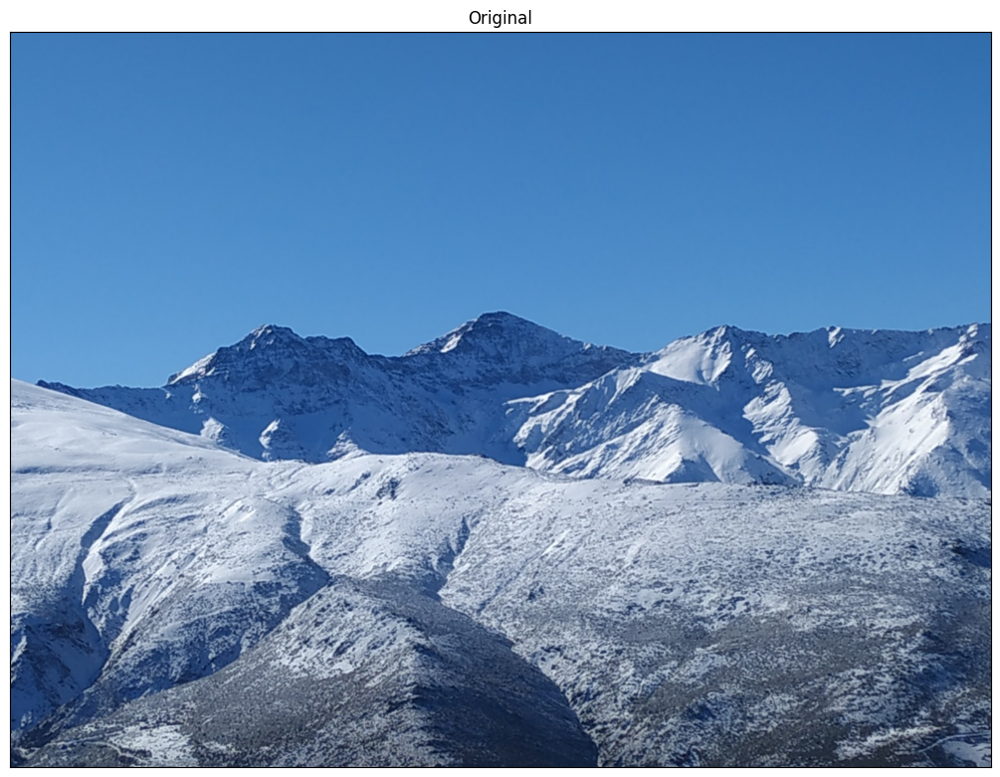

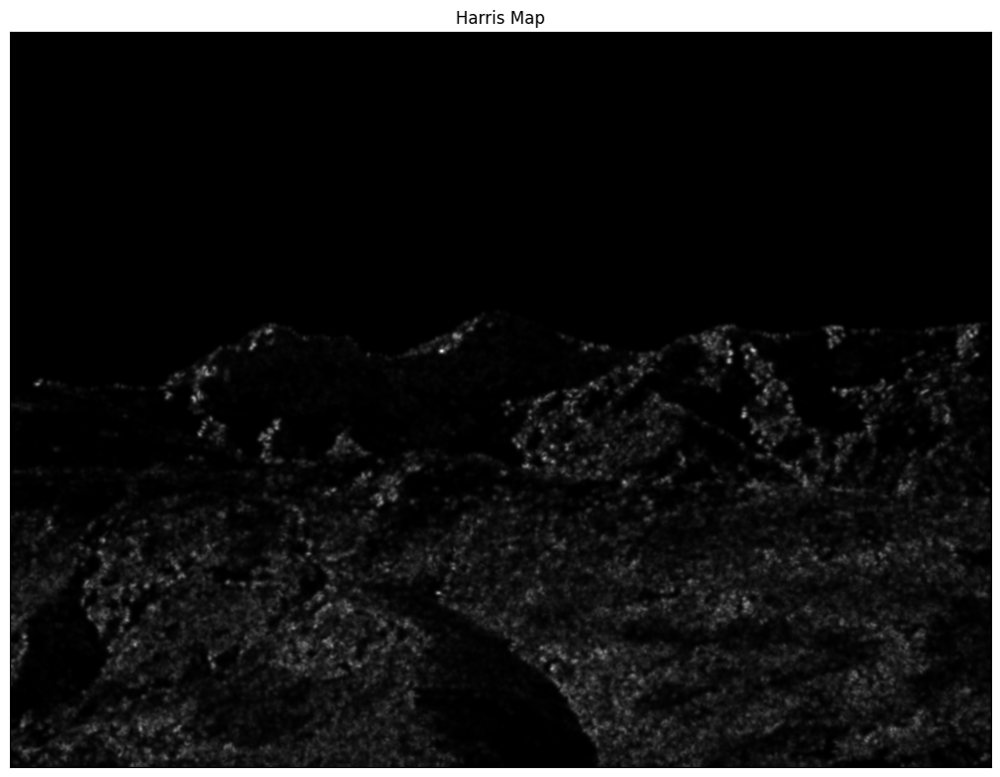

In [ ]:
from skimage.feature import corner_peaks
# Leo imagen
img=readIm(get_image('IMG_20220312_102944_S.jpg'),1)
# Paso a escala de grises
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Derivadas de la imagen en escala de grises
sigmaD = 1.5
dx, dy = derivatives(img_gray, sigmaD)

# Mapa de Harris
sigmaI = 1.5 * sigmaD
harrisMap = HarrisMap(dx, dy, sigmaI)

# Visualizo el original y el mapa de respuestas de Harris
displayIm(img,'Original', 2)
displayIm(harrisMap,'Harris Map', 2)

El resultado obtenido tiene sentido. Como podemos ver las respuestas son más altas (blancas) en zonas de cambio de intensidad. Ahora queremos hacer supresión de no máximos con nuestra función y visualizar el mapa de Harris umbralizado.


Número de Keypoints Detectados:  458


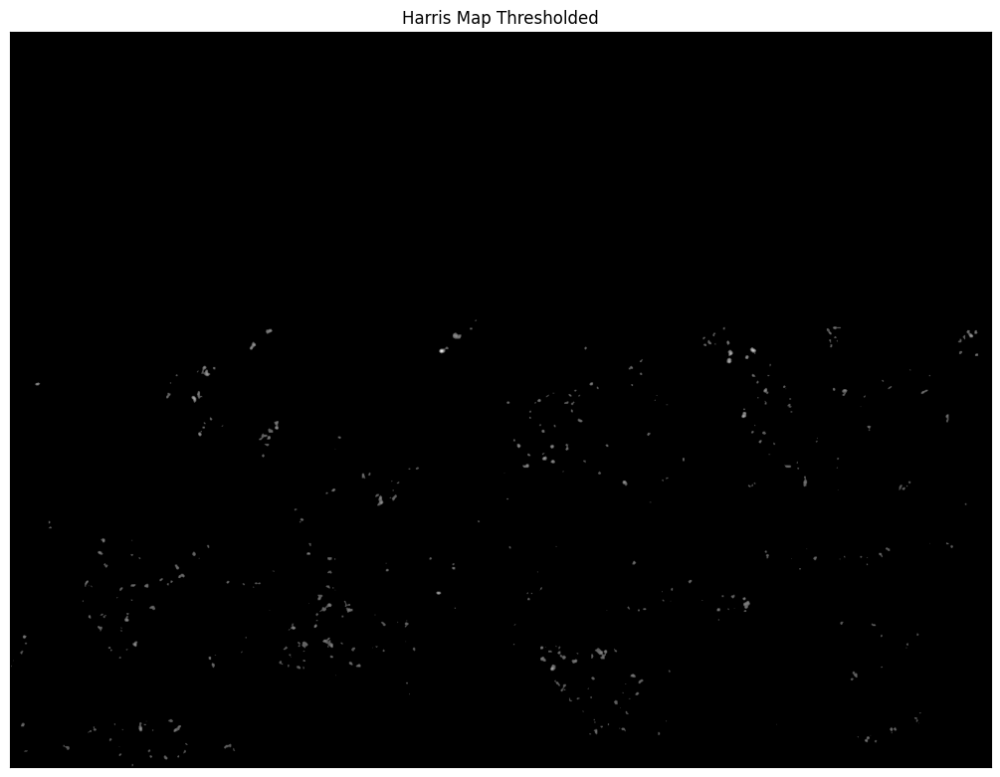

In [ ]:
# Distancia mínima entre puntos y umbral
min_distance, threshold = 2, 1600
# Supresión de no máximos, solo interesan coordenadas
coord = [(x, y) for x, y, _ in NonMaximaSuppression(harrisMap, min_distance, threshold)]

# Umbralización del mapa de Harris
harrisMap2 = harrisMap.copy()
harrisMap2[harrisMap2 < threshold] = 0

print('\nNúmero de Keypoints Detectados: ', len(coord))
displayIm(harrisMap2,'Harris Map Thresholded',2)

Obtenemos $458$ keypoints en el rango que queríamos. También se observa como en el mapa umbralizado se han suprimido los keypoints con respuestas menos fuertes. Ahora procedemos a dibujar los keypoints con sus orientaciones en la imagen original, usando nuestras funciones y `cv2.drawKeypoints()`.


Número de Keypoints Detectados:  458


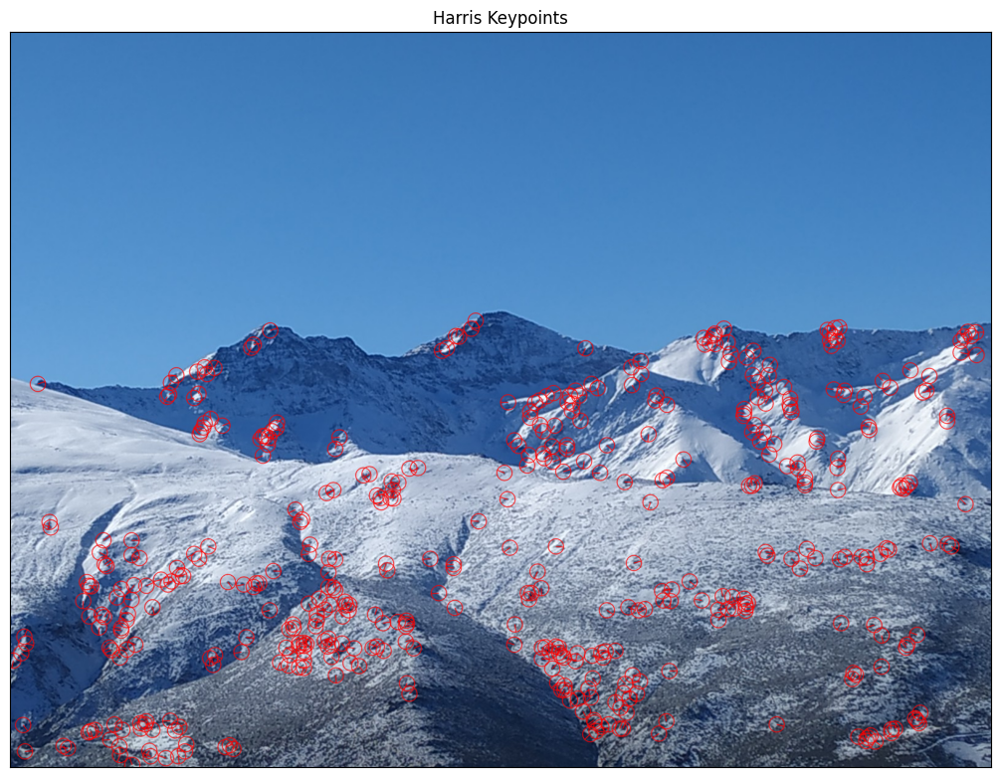

In [ ]:
# Tamaño
size=4*np.floor(3*sigmaI)+1
# Orientaciones
theta = orientation(dx, dy)
# Key points
keypoints = keyPoints(coord, theta, size)
print('\nNúmero de Keypoints Detectados: ', len(keypoints))

# Dibujar los keypoints en la imagen a color
harrisKeypoints = cv2.drawKeypoints(img, keypoints, outImage=img.copy(), color=(255,0,0),
flags=cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG+cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
displayIm(harrisKeypoints,'Harris Keypoints',2)

El resultado obtenido tiene bastante sentido, se detectan esquinas en la zona montañosa con cambios de intensidad.

# <font color='blue'>**Ejercicio 2:** Emparejamiento de _keypoints_ entre imágenes usando descriptores SIFT, HOG y LBP (3 puntos)

<font color='blue'>En este apartado, partiendo de un detector de características (SIFT) y tres descriptores de características (SIFT, HOG y LBP), vamos a calcular el emparejamiento entre _keypoints_ de dos imágenes. Las imágenes con las que se trabajará en este ejercicio serán `IMG_20220312_102940_S.jpg` y `IMG_20220312_102944_S.jpg`. Estas imágenes son de $1200\times1600$ pero, tras leerlas, se debe reducir su tamaño a la mitad ($600\times800$). Es en esta última dimensionalidad en la que realizaremos todo el ejercicio y visualizaremos las imágenes. Y, a continuación, debemos pasarlas a escala de grises. Nota importante: del mismo modo que se calculan _keypoints_ y descriptores en escala de grises, luego los matches/emparejamientos sí se visualizan sobre las imágenes originales en color.

## <font color='blue'>SIFT (Scale-invariant feature transform)

<font color='blue'>En un primer momento, el alumnado debe aplicar el algoritmo SIFT a ambas imágenes para extraer los puntos de interés (_keypoints_) y los descriptores (https://docs.opencv.org/3.4/dc/dc3/tutorial_py_matcher.html). Luego, vamos a emplear tres criterios de emparejamiento: _brute force_ (`cv2.BFMatcher`), _brute force with cross-check_ (`cv2.BFMatcher` con `crossCheck=True`) y el _Lowe's ratio test_ (`knnMatch`) para calcular los emparejamientos y mostrar los 100 mejores matches utilizando la función `cv2.drawMatches`.

<font color='blue'>En los siguientes apartados, emplearemos exactamente los mismos _keypoints_ detectados por SIFT para calcular otros descriptores en dichas localizaciones y comparar los resultados obtenidos. En los próximos apartados también se utilizarán y compararán los mismos tres criterios de emparejamiento indicados (_BF_, _BF+CC_ y _Lowe's ratio test_).

El algoritmo SIFT es un extractor y descriptor de puntos de interés (keypoints) invariante ante traslaciones, rotaciones y escalado. Además es robusto ante transformaciones de perspectiva moderadas y variaciones en iluminación. Se divide en tres etapas:

1.   Detección de keypoints en diferentes escalas
2.   Asignación de orientación principal a cada keypoint
3.   Cálculo del vector descriptor de cada keypoint

El descriptor describe $16$ celdas alrededor del keypoint, con $8$ orientaciones en cada una, de modo que el tamaño es de $128$ dimensiones.

Creamos función para calcular los keypoints SIFT con sus descriptores, usando `cv2.SIFT_create`.

In [ ]:
# Función para calcular keypoints con descriptores SIFT
def siftPoints(im,nfeatures=5000):
  sift = cv2.SIFT_create(nfeatures=nfeatures) # SIFT
  kp,ds = sift.detectAndCompute(im,None)      # Keypoints y descriptores
  return kp,ds

In OpenCV the output of a matching process is a vector of records. Each record provides information about the indexes of the matched KeyPoints and the distance between them.

Creamos `showKP` que muestra los keypoints de una imagen con `drawKeypoints`, `showMatches` que muestra los emparejamientos de los keypoints de dos imágenes dadas con `drawMatches`, `matching` que calcula los emparejamientos de los descriptores de dos imágenes usando `cv2.BFMatcher` en función de un flag con criterio de emparejamiento: Brute force (menor distancia $L_2$), Brute force + Cross check (menor distancia $L_2$ en ambas direcciones) y Lowe's ratio test, que consiste en comparar la distancia entre un keypoint y su mejor match, junto con la distancia entre ese keypoint con su segundo mejor match. Si la primera distancia es suficientemente pequeña en comparación con la segunda, tenemos un match no ambiguo y nos quedamos con él. Es decir, si el cociente de los dos es menor que un umbral preestablecido. En otro caso tendríamos ambigüedad, ya que el primer y segundo mejor match no tienen gran diferencia, luego hay menos seguridad de que el match sea bueno.

In [ ]:
# This function display the KeyPoints of an image
def showKP(im,kp,title):
  img=cv2.drawKeypoints(im, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  displayIm(img,title,1) # Mostrar imagen

# This function display the matches between two images
def showMatches(im1,kp1,im2,kp2,matches, N, title='Matches'):
  imBF=cv2.drawMatches(im1, kp1, im2, kp2, matches[:N], None,
                       flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  displayIm(imBF,title,2) # Mostrar imagen

#This function compute matches between descriptors of two images
def matching(ds1,ds2,FlagMode='BF+CC'):
  # Brute force
  if FlagMode=='BF':
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck = False)
    matches = bf.match(ds1, ds2) # Emparejo
    matches = sorted(matches, key=lambda x: x.distance) # Ordeno de mejor a peor
    return matches
  # Brute force + cross check
  elif FlagMode=='BF+CC':
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck = True)
    matches = bf.match(ds1, ds2) # Emparejo
    matches = sorted(matches, key=lambda x: x.distance) # Ordeno de mejor a peor
    return matches
  # Lowe's test
  elif FlagMode=='KNN':
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck = False)
    knnMatches = bf.knnMatch(ds1, ds2, k=2) # Emparejo KNN con k=2
    # Hago Lowe's test
    good = [m1 for m1,m2 in knnMatches if m1.distance/m2.distance < 0.75]
    good = sorted(good, key=lambda x: x.distance) # Ordeno de mejor a peor
    return good
  else:
    return print('Error in Matching mode')


Queremos $100$ matches.

In [ ]:
numberOfmatches = 100

Hacemos resize de las imágenes y las pasamos a escala de grises.

In [ ]:
img1=cv2.resize(readIm(get_image('IMG_20220312_102940_S.jpg'),1), (0,0), fx=0.5, fy=0.5)
im1=cv2.cvtColor(img1,cv2.COLOR_RGB2GRAY)
img2=cv2.resize(readIm(get_image('IMG_20220312_102944_S.jpg'),1), (0,0), fx=0.5, fy=0.5)
im2=cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)

Calculo los keypoints y descriptores SIFT, muestro los keypoints.

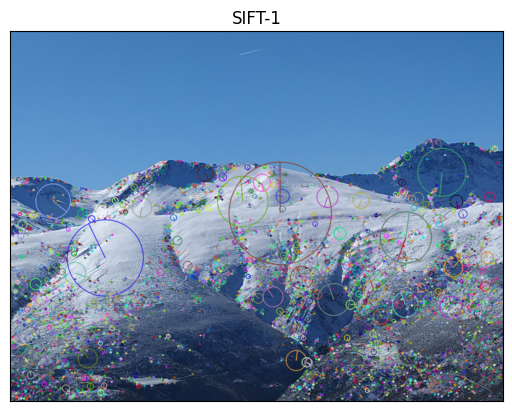

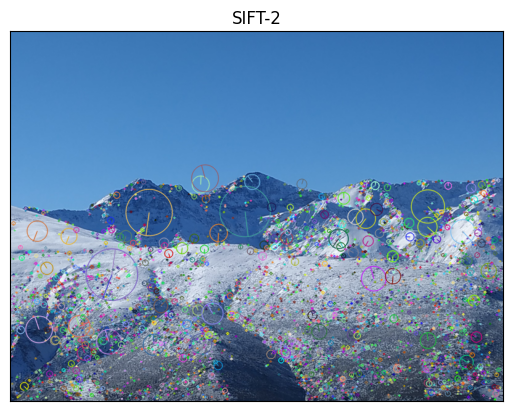

In [ ]:
# Keypoints y descriptores SIFT
kp1, ds1 = siftPoints(im1)
kp2, ds2 = siftPoints(im2)

# Muestro keypoints
showKP(img1, kp1, 'SIFT-1')
showKP(img2, kp2, 'SIFT-2')

Como podemos ver, SIFT detecta bastante bien los keypoints. Ahora emparejo con distintos criterios (BF, BF+CC y Lowe).

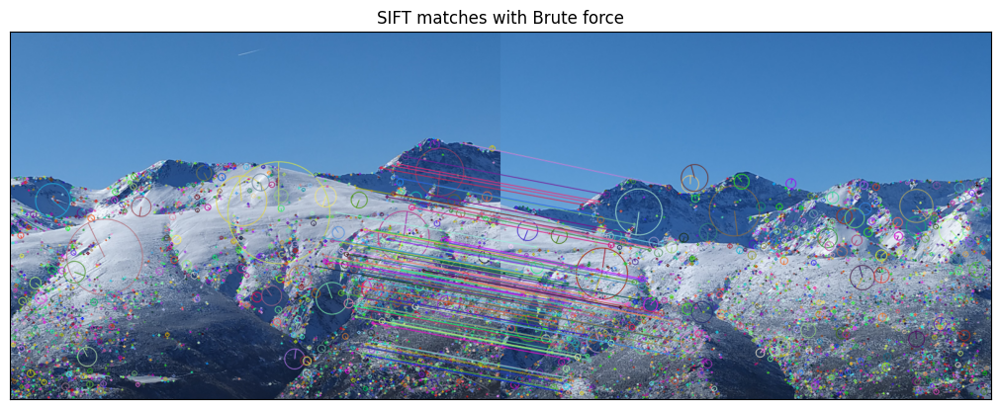

In [ ]:
# Emparejo con Brute force
matchesBF = matching(ds1, ds2, FlagMode='BF')
# Muestro emparejamientos
showMatches(img1, kp1, img2, kp2, matchesBF, numberOfmatches, title='SIFT matches with Brute force')

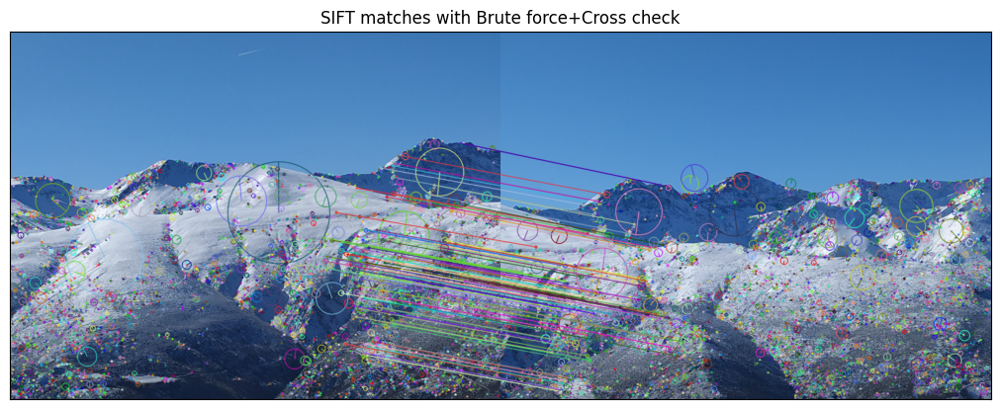

In [ ]:
# Emparejo con Brute force + Cross check
matchesBFCC = matching(ds1, ds2, FlagMode='BF+CC')
# Muestro emparejamientos
showMatches(img1, kp1, img2, kp2, matchesBFCC, numberOfmatches, title='SIFT matches with Brute force+Cross check')

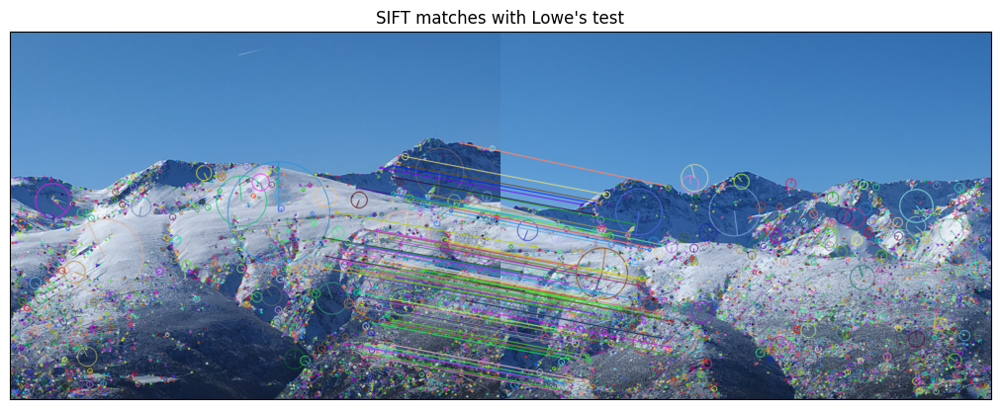

In [ ]:
# Emparejo con Lowe's test
matchesLowe = matching(ds1, ds2, FlagMode='KNN')
# Muestro emparejamientos
showMatches(img1, kp1, img2, kp2, matchesLowe, numberOfmatches, title="SIFT matches with Lowe's test")

El resultado es bastante bueno en los tres casos. Tenemos matches paralelos que nos unen las dos imágenes donde queríamos, SIFT detecta y describe muy bien los keypoints.
En general no se nota mucha diferencia usando distintos criterios de emparejamiento. Parece que el SIFT en sí calcula descriptores tan buenos que influye poco el criterio. Esto tiene sentido, ya que si pensamos un poco en qué consiste el Brute Force, que supuestamente tiene que ser el criterio menos robusto, este va mal cuando los descriptores no describen muy bien a los keypoints. Si la calidad es alta, es normal que el criterio importe poco.

## <font color='blue'>LBP (Local Binary Patterns)

<font color='blue'>Ahora, vamos a hacer lo mismo de antes, pero empleando las características LBP (del paquete `mahotas`: `mahotas.features.lbp`). Para ello debemos crear una pequeña ventana ($7\times7$ pixels) centrada en torno a los SIFT keypoints detectados, y calcular el vector de características correspondiente (empleando `radius=1` y `points=8`).

<font color='blue'>¿Posee este vector de características el tamaño indicado en teoría? Si no es así, ¿a qué se puede deber?


LBP (Local Binary Patterns) opera en un entorno local de un punto. Cada vecino del píxel se representa como $1$ si es menor que el píxel, o $0$ si no, de modo que el vecindario se puede representar como un número binario, con un bit por píxel vecino. Esa representación se traduce en base $10$ y se guarda para cada píxel. Finalmente esos valores se pueden visualizar como un histograma de dimensión $2^{vecinos}$. Este es el vector descriptor.

LBP es computacionalmente muy simple y robusto a cambios en escala de grises de iluminación, por ejemplo. Instalamos `mahotas` para usar LBP.

In [ ]:
!pip install mahotas

Creamos la función que nos calcula los descriptores de la imagen. Omitimos la ventana si nos quedamos fuera de la imagen. Tenemos una ventana $7\times7$ y hacemos LBP con `radius=1` y `points=8`, es decir consideramos $8$ vecinos a un píxel del centro. En teoría esto debería proporcionar vectores descriptores de $2^8=256$ dimensiones.

In [ ]:
import mahotas
# Función para el cálculo de los descriptores LBP
def lbpDescriptors(im, kp, window_size=7, radius=1, points=8):
  half, lbp = window_size // 2, []
  for p in kp:
    x, y = int(p.pt[0]), int(p.pt[1])
    # Omito ventana que se sale
    if x - half < 0 or y - half < 0 or \
      x + half >= im.shape[1] or y + half >= im.shape[0]:
      continue
    # Extraigo ventana
    window = im[y - half : y + half + 1, x - half : x + half + 1]
    # Calculo descriptores LBP
    lbp.append(mahotas.features.lbp(window, radius, points))
  return np.array(lbp, dtype=np.float32)

Calculamos los descriptores y vemos qué dimensión tienen.

In [ ]:
# Calculo descriptores LBP
ds1_lbp, ds2_lbp = lbpDescriptors(im1, kp1), lbpDescriptors(im2, kp2)
print(f"Image 1 descriptor shape: {ds1_lbp.shape}")
print(f"Image 2 descriptor shape: {ds2_lbp.shape}")

Image 1 descriptor shape: (3834, 36)
Image 2 descriptor shape: (3859, 36)


$36$ en vez de los $256$ esperados. Eso es debido a que `mahotas.features.lbp` comprime el histograma resultante para que no aparezcan valores imposibles. Es decir que nos quedamos solo con los valores que aparecen en la imagen y los usamos para describir el keypoint.

Ahora mostramos los emparejamientos.

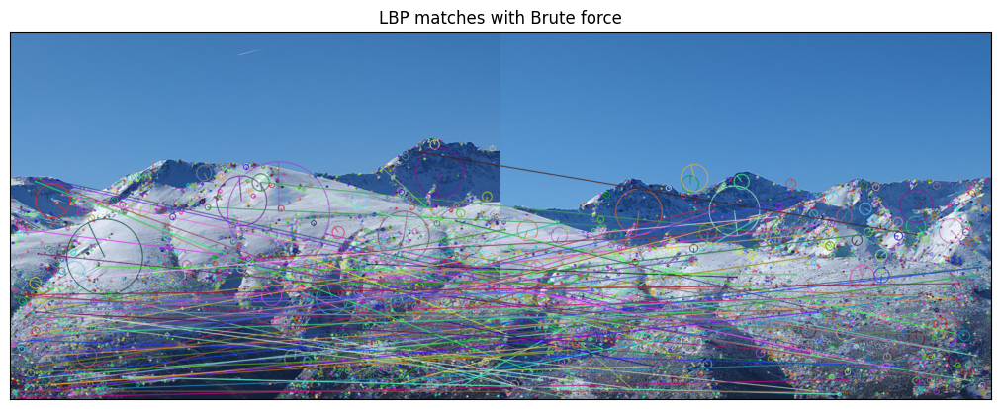

In [ ]:
# Emparejo con Brute force
matchesBF_lbp = matching(ds1_lbp, ds2_lbp, FlagMode='BF')
# Muestro emparejamientos
showMatches(img1, kp1, img2, kp2, matchesBF_lbp, numberOfmatches, title='LBP matches with Brute force')

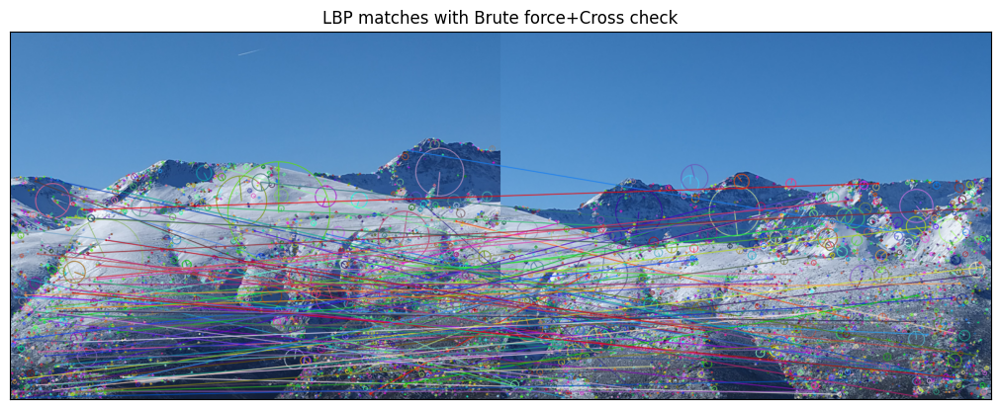

In [ ]:
# Emparejo con Brute force + Cross check
matchesBFCC_lbp = matching(ds1_lbp, ds2_lbp, FlagMode='BF+CC')
# Muestro emparejamientos
showMatches(img1, kp1, img2, kp2, matchesBFCC_lbp, numberOfmatches, title='LBP matches with Brute force+Cross check')

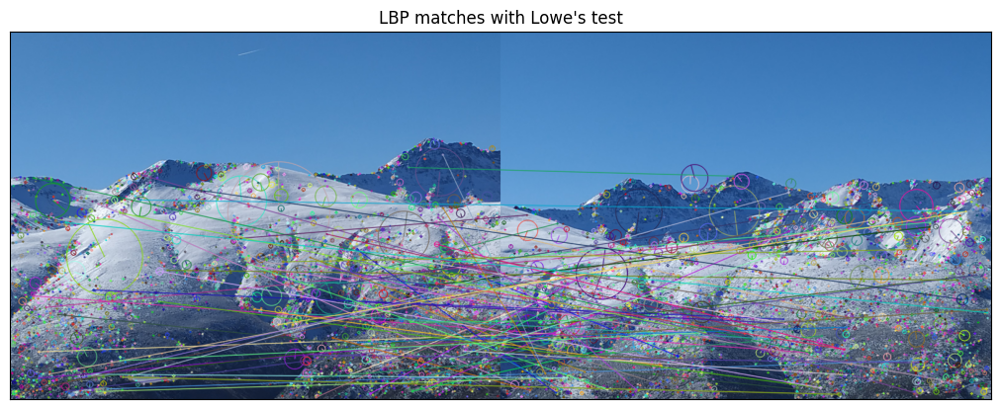

In [ ]:
# Emparejo con Lowe's test
matchesLowe_lbp = matching(ds1_lbp, ds2_lbp, FlagMode='KNN')
# Muestro emparejamientos
showMatches(img1, kp1, img2, kp2, matchesLowe_lbp, numberOfmatches, title="LBP matches with Lowe's test")

Como podemos ver, el resultado es muy malo en todos los casos, aunque en Lowe se nota que hay algo menos de matches caóticos, aunque siguen siendo extremadamente malo el resultado obtenido. Esto tiene bastante sentido teniendo en cuenta que LBP no es robusto a cambios de escala, rotación, iluminación, etc. En principio viendo el resultado de SIFT vemos que realmente lo que tenemos es una traslación, pero aun así los resultados son malos. La ventana es bastante pequeña, la dimensionalidad del vector es pequeña también $36$ vs $128$ y LBP es muy sensitivo al ruido, ya que usa patrones binarios para describir los keypoints.

Hay que tener en cuenta que LBP se usa más para describir texturas, no para describir keypoints. Es normal que los resultados sean muy malos. De hecho si nos fijamos vemos que se detectan zonas con texturas parecidas, pero no se detectan keypoints parecidos. LBP no es adecuado como descriptor de keypoints.

## <font color='blue'>HOG (Histogram of oriented gradients)

<font color='blue'>Ahora hacemos lo mismo, pero con la implementación de HOG disponible en `skimage.feature`. Se deben emplear $9$ orientaciones, $8\times8$ pixels por celda, y $2\times2$ celdas por bloque (importante hacer _resize_ de la ventana/región de $7\times7$ al tamaño estándar de HOG: $64\times128$ pixels). ¿Cuál es la dimensionalidad de este vector de características y por qué?

HOG (Histogram of Oriented Gradients) es un descriptor global en el que calculamos los gradientes de una imagen $64\times128$ (las dimensiones de la imagen son así por que el trabajo original se centraba en la detección de peatones), dividimos la imagen en bloques de $16\times16$ píxeles, cada uno subdividido en $2\times2$ celdas de $8\times8$ píxeles. Luego en total tenemos $7\times15=105$ bloques. Después cuantificamos cada celda en un histograma con $9$ orientaciones, con los votos por magnitud del gradiente. Esos histogramas se normalizan y finalmente obtenemos vectores descriptores de dimensión $105\times4\times9=3780$.

Creamos la función para calcular los descriptores HOG. El HOG se aplica en la ventana $7\times7$ de cada keypoint, haciendo un resize para que la ventana sea $64\times128$. En el `resize` usamos `mode=reflect` para tener transiciones suaves y en el `hog` usamos `block_norm=L2-Hys` que es más robusto a outliers.

In [ ]:
from skimage.feature import hog
from skimage.transform import resize
def hogDescriptors(im, kp, window_size=7, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2)):
    half, hog_features = window_size // 2, []
    for p in kp:
        x, y = int(p.pt[0]), int(p.pt[1])
        # Omito ventanas fuera de bordes
        if x - half < 0 or y - half < 0 or \
           x + half >= im.shape[1] or y + half >= im.shape[0]:
            continue
        # Extraigo ventana 7x7
        window = im[y - half:y + half + 1, x - half:x + half + 1]
        # Redimensiono la ventana a 64x128 píxeles
        resized_window = resize(window, (128, 64), mode='reflect', anti_aliasing=True)
        # Calculo descriptor HOG
        features = hog(resized_window, orientations=orientations, pixels_per_cell=pixels_per_cell,
                       cells_per_block=cells_per_block, block_norm='L2-Hys', visualize=False)
        hog_features.append(features)
    return np.array(hog_features, dtype=np.float32)

Calculamos los descriptores y sus dimensionalidades.

In [ ]:
# Calculo descriptores HOG
ds1_hog, ds2_hog = hogDescriptors(im1, kp1), hogDescriptors(im2, kp2)
print(f"Image 1 descriptor shape: {ds1_hog.shape}")
print(f"Image 2 descriptor shape: {ds2_hog.shape}")

Image 1 descriptor shape: (3834, 3780)
Image 2 descriptor shape: (3859, 3780)


Como podemos ver, $3780$ tal y como esperabamos en teoría. Mostramos los matches.

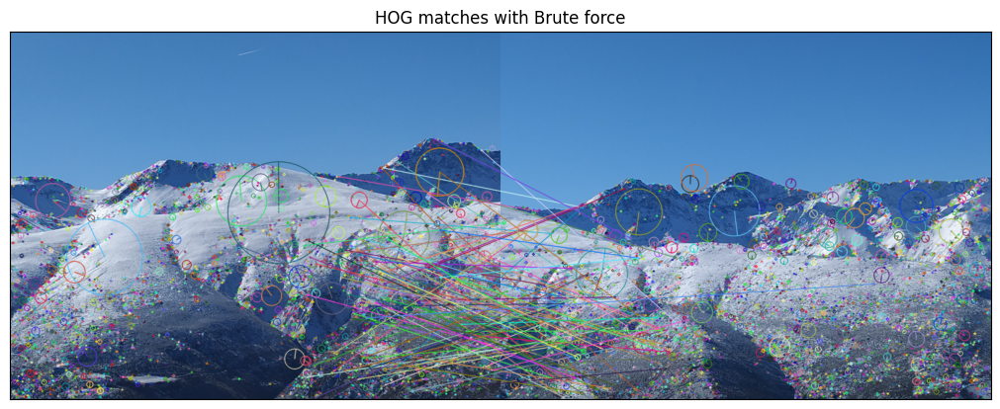

In [ ]:
# Emparejo con Brute force
matchesBF_hog = matching(ds1_hog, ds2_hog, FlagMode='BF')
# Muestro emparejamientos
showMatches(img1, kp1, img2, kp2, matchesBF_hog, numberOfmatches, title='HOG matches with Brute force')

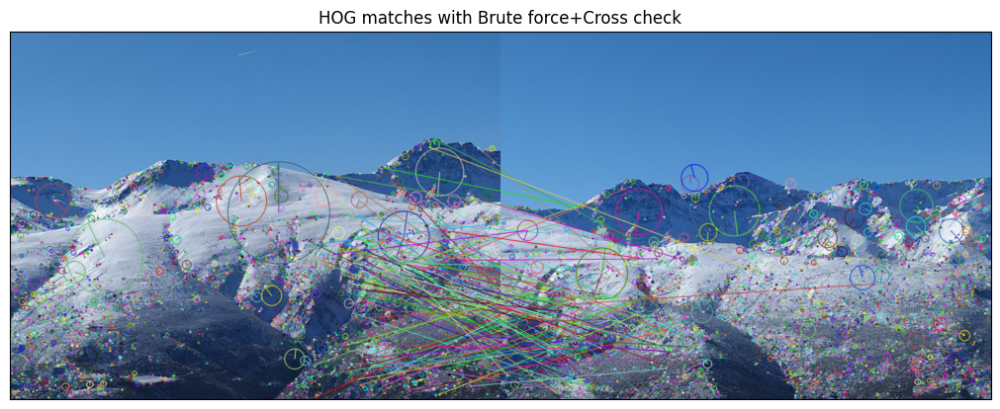

In [ ]:
# Emparejo con Brute force + Cross check
matchesBFCC_hog = matching(ds1_hog, ds2_hog, FlagMode='BF+CC')
# Muestro emparejamientos
showMatches(img1, kp1, img2, kp2, matchesBFCC_hog, numberOfmatches, title='HOG matches with Brute force+Cross check')

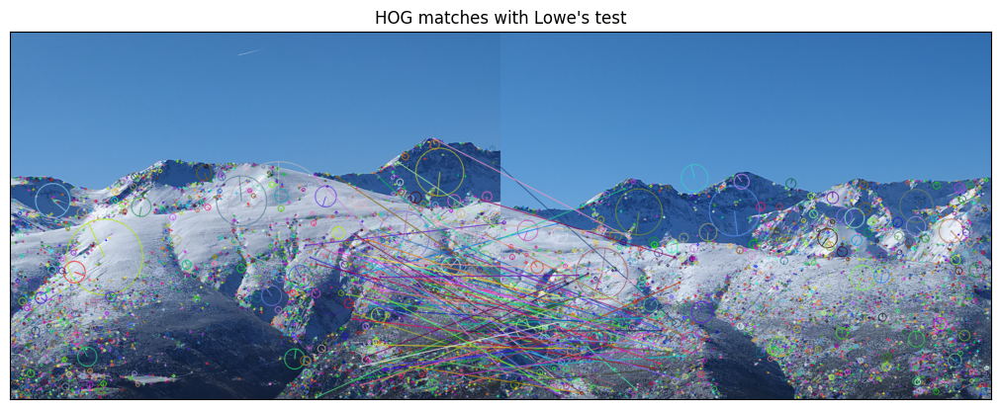

In [ ]:
# Emparejo con Lowe's test
matchesLowe_hog = matching(ds1_hog, ds2_hog, FlagMode='KNN')
# Muestro emparejamientos
showMatches(img1, kp1, img2, kp2, matchesLowe_hog, numberOfmatches, title="HOG matches with Lowe's test")

El resultado es mucho mejor que LBP pero peor que SIFT. Que HOG funcione mejor que LBP es normal, tiene una descripción más rica de los keypoints y es bastante robusto. Pero SIFT sigue siendo mejor.

<font color='blue'> ¿Cuál de los descriptores anteriores parece más adecuado para _keypoint matching_ y por qué?

El mejor es claramente SIFT por diversas razones: es muy robusto, invariante a traslaciones, rotaciones y escalado, robusto ante pequeños cambios de perspectiva e iluminación. En general describe muy bien el área alrededor del keypoint. HOG intenta hacer lo mismo pero comete muchos errores en el matching, no tiene la capacidad discriminativa de SIFT.

# <font color='blue'>**Ejercicio 3:** Creación de panoramas/mosaicos (_Image Stitching_) empleando homografías (5 puntos)

<font color='blue'>Ahora vamos a calcular homografías entre imágenes y usarlas para construir un mosaico/panorama. Para calcular la homografía entre dos imágenes, hay que llamar a la función `cv2.findHomography()`, que toma como entrada las listas de _keypoints_ y los matches/emparejamientos encontrados. Se debe usar RANSAC para realizar una estimación robusta.

Una homografía es una transformación proyectiva que mapea puntos de imágenes en planos distintos. Es una matriz $3\times3$ con $8$ grados de libertad, de modo que para calcularla hacen falta $4$ puntos (cada punto resuelve $2$ restricciones). En general solemos tener más de $4$ así que eso no es un problema. De hecho el tener más puntos nos da mayor libertad a la hora de elegir la homografía más adecuada. En nuestro caso, nosotros usamos RANSAC (RANdom SAmple Consensus) para estimar de forma robusta la homografía. Consiste en:


1.   Muestrear puntos, en nuestro caso $4$ matches escogidos aleatoriamente.
2.   Calculamos la homografía para esos matches.
3.   Calculamos el número de matches explicados por la homografía, es decir el soporte de nuestro modelo.
4.   Repetimos intentando maximizar el número de inliers hasta tener un número adecuado.

De esta forma minimizamos la influencia de outliers que en nuestro caso serían matches incorrectos. Usamos `cv2.findHomography` con parámetros las coordenadas de los puntos en la primera y segunda imagen, el método de cálculo de la matriz, que es RANSAC en nuestro caso, y el error máximo permitido para considerar un match como inlier.


In [ ]:
# this function computes a homography
def homography(kp1,kp2,matches,Ransac_Error,MIN_MATCH_COUNT=20):
  H = None # Homografía
  if len(matches)>MIN_MATCH_COUNT:
    # Keypoints de los matches, queryIdx y trainIdx son los índices de los
    # keypoints en la primera y segunda imagen. Forzamos dimensiones (1,2)
    points1 = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    points2 = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    # Homografía con RANSAC usando RANSAC
    H, _ = cv2.findHomography(points1, points2, cv2.RANSAC, Ransac_Error)
  else:
     print('Error - very few matches')
  return H

<font color='blue'>Para componer el mosaico necesitamos realizar los siguientes pasos:

> <font color='blue'>a) Escoger un tamaño máximo para el lienzo/canvas sobre el que vamos a pegar y "encajar" todas las imágenes (tamaño que depende del número de imágenes a unir/componer y sus dimensiones).

> <font color='blue'>b) Escoger la imagen central que dará los ejes al mosaico (que debemos escoger con criterio, de cara a mejorar la calidad final del mosaico).

> <font color='blue'>c) Establecer el orden de cada imagen respecto a la central (es decir, podemos asumir que, a priori, conocemos la posición de cada imagen en la serie de imágenes tomadas y, como consecuencia, conocemos qué imágenes están a la derecha y/o a la izquierda de otras; en otras palabras, conocemos el orden en que fueron tomadas las fotografías en el movimiento de izquierda a derecha sacando la panorámica).

> <font color='blue'>d) Calculamos la homografía para copiar la imagen central en el lienzo (que es solamente una traslación).

> <font color='blue'>e) A continuación debemos ir leyendo las imágenes de izquierda a derecha, y debemos calcular la homografía entre cada par de imágenes consecutivas.

> <font color='blue'>f) Con la información anterior, debemos componer la homografía entre cada imagen y el lienzo/canvas. Es decir, la matriz que lleva cada imagen/foto a su posición correcta en el lienzo.

> <font color='blue'>g) Ahora, debemos utilizar las homografías calculadas para transportar las imágenes al lienzo (por medio de la función `cv2.warpPerspective()`). Es importante ir de fuera hacia dentro, es decir, desde los extremos hasta el centro, pegando en último término la imagen central, que es la que presentará un menor grado de deformación.

> <font color='blue'>i) Finalmente, debemos eliminar las regiones negras de los bordes del canvas para mejorar la calidad final del mosaico.

<font color='blue'>Se debe componer el mosaico de Sierra Nevada con las imágenes `IMG_20220312_102934_S.jpg`, `IMG_20220312_102937_S.jpg`, `IMG_20220312_102940_S.jpg`, `IMG_20220312_102942_S.jpg`, `IMG_20220312_102944_S.jpg`, `IMG_20220312_102946_S.jpg`, `IMG_20220312_102948_S.jpg`, `IMG_20220312_102950_S.jpg`, `IMG_20220312_102951_S.jpg`, `IMG_20220312_102954_S.jpg`, y `IMG_20220312_102957_S.jpg`. Se recomienda operar con ellas con la mitad de resolución. Es decir, se debe hacer un resize para emplear imágenes de la mitad de filas y columnas del tamaño original.


Nuestro objetivo es componer un panorama a partir de múltiples imágenes que están parcialmente superpuestas. Para eso iremos de izquierda a derecha, elegiremos una imagen central, calcularemos las homografías entre imágenes consecutivas usando emparejamientos de keypoints, y después componemos las homografías para que cada imagen se lleve al panorama alineándose con la imagen central.

Ahora creamos las funciones para calcular las homografías de imágenes consecutivas, las homografías que llevan las imágenes al lienzo (menos central), y la homografía que lleva la imagen central al lienzo. A la hora de crear el mosaico hay que tener en cuenta que si tenemos $n$ imágenes tenemos $n-1$ homografías, y la homografía con índice $idx$ es entre las imágenes $idx$ y $idx+1$. Las homografías a la izquierda de la central se compondrán para alinear las imágenes con la central, y las homografías a la derecha se compondrán también tras invertirse (ya que la homografías tienen que ir de derecha a izquierda, no al revés como están al principio). Gastamos cuidado con los índices.

In [ ]:
# this function computes the homographies between each two consecutive images
def computeLocalHomographies(images,method='KNN', Ransac_Error=5.0):
  H = [] # Homografías
  # Recorro parejas de imágenes
  for i in range(len(images)-1):
    # Keypoints y descriptores en imágenes consecutivas
    kp1, ds1 = siftPoints(images[i])
    kp2, ds2 = siftPoints(images[i+1])
    # Matches entre los descriptores
    matches = matching(ds1, ds2, FlagMode=method)
    # Homografía entre las dos imágenes
    hom = homography(kp1, kp2, matches, Ransac_Error)
    H.append(hom)
  return H

# this function computes the homography from each image to the canvas
# idx in this case is the index of the central image
def mosaicHomographies(H,idx):
  # Invierto homografía entre imágenes idx e idx+1
  H[idx] = np.linalg.inv(H[idx])
  # Composición de homografías a la derecha de la imagen central
  for i in range(idx+1, len(H)):
    H[i] = np.linalg.inv(H[i]) # Invierto homografía
    H[i] = H[i-1] @ H[i]       # Calculo homografía final
  # Composición de homografías a la izquierda de la imagen central
  for i in range(idx-2, -1, -1):
    H[i] = H[i+1] @ H[i]       # Calculo homografía final
  return H

# this function fixes the homography from the central image to the canvas
def axesHomography(sizeim,sizecanvas):
  H=np.eye(3)                           # Identidad de orden 3
  H[0,2]=sizecanvas[1]//2-sizeim[1]//2  # Traslación X
  H[1,2]=sizecanvas[0]//2-sizeim[0]//2  # e Y
  return H

Creamos las funciones auxiliares que definen el lienzo y eliminan píxeles negros redundantes. El lienzo es creado con filas y columnas multiplicadas por el número de imágenes `nim`. El lienzo será más grande de lo necesario, pero lo que sobra será negro y se recortará con `blackOut`.

In [ ]:
# Auxiliary functions

# this function defines and return the canvas
# nim es el número de imágenes
def setCanvas(row,col,flagColor,nim=2):
  if flagColor: # RGB o escala de grises
    return np.zeros((row*nim, col*nim, 3), np.uint8)
  else:
    return np.zeros((row*nim, col*nim), np.uint8)

# This function removes the redundant pixels from the canvas
def blackOut(img, offset=0):
  if len(img.shape)==3: # RGB
    im =cv2.cvtColor(img,cv2.COLOR_RGB2GRAY) # Paso a escala de grises
    mask = np.array((im > 0), np.uint8) # Máscara con True si > 0 y False si no
    x,y,w,h=cv2.boundingRect(mask) # Rectángulo que separa la imagen de lo negro
    return img[y+offset:y+h-offset,x+offset:x+w-offset,:] # Recorte
  else:
    mask = np.array((img > 0), np.uint8)
    x,y,w,h=cv2.boundingRect(mask)
    return img[y+offset:y+h-offset,x+offset:x+w-offset]


Creamos la función que compone el panorama final. Usamos `cv2.warpPerspective` para trasladar primero las imágenes a la izquierda, después a la derecha, y por último la imagen central. En cada paso visualizamos el panorama que hay.

In [ ]:
# This function composes the mosaic. It receives:
# * images: the list of images
# * canvas: the canvas, generated through the application of setCanvas()
# * H: the list of homographies, obtained through the application of
# computeLocalHomographies() and mosaicHomographies()
# * idx: the index of the central image
# * H0: the homography that represents the translation from the central image to the
# canvas obtained through the application of axesHomography()
def composeMosaic(images,canvas,H,idx,H0):
  rows, cols = canvas.shape[:2]
  # Imágenes a la izquierda
  for i in range(0, idx):
    canvas = cv2.warpPerspective(images[i], H0 @ H[i], (cols, rows),
          dst=canvas, flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_TRANSPARENT)
    displayIm(blackOut(canvas), '')

  # Imágenes a la derecha
  for i in range(len(images)-1, idx, -1):
    canvas = cv2.warpPerspective(images[i], H0 @ H[i-1], (cols, rows),
          dst=canvas, flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_TRANSPARENT)
    displayIm(blackOut(canvas), '')

  # Imagen central
  canvas = cv2.warpPerspective(images[idx], H0, (cols, rows),
          dst=canvas, flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_TRANSPARENT)
  displayIm(blackOut(canvas), '')
  return canvas

<font color='blue'>Se debe mostrar la composición, paso a paso, del canvas, es decir, el canvas a medida que se le van incorporando cada una de las imágenes, así como la composición final del mosaico. Finalmente, se debe comparar el resultado de nuestra composición manual con el _stitcher_ de OpenCV: `cv2.Stitcher`.

<font color='blue'>Al igual que en todas las demás entregas y ejercicios, resulta fundamental documentar el trabajo realizado, y explicar pausadamente todas las etapas implementadas (qué se ha hecho, cómo se ha hecho, y por qué se ha hecho así).

Creamos el panorama usando las funciones que hemos definido. Hacemos resize de las imágenes y creamos el canvas con las filas y columnas de la imagen más grande como parámetros. Hemos elegido la imagen con índice $4$ como central, la elección es basada en la localización espacial de esa foto (más o menos en el centro del panorama final). Por último mostramos el panorama obtenido.

In [ ]:
PREFIX='IMG_20220312_1029'
nameImages=['34_S.jpg','37_S.jpg','40_S.jpg','42_S.jpg','44_S.jpg','46_S.jpg','48_S.jpg','50_S.jpg','51_S.jpg','54_S.jpg','57_S.jpg']

images, idx = [], 4 # Imágenes e índice de imagen central
for item in nameImages:
   images.append(cv2.resize(readIm(get_image(PREFIX+item),flagColor=1), (0,0), fx=0.5, fy=0.5))

H = mosaicHomographies(computeLocalHomographies(images), idx) # Homografías
max_row = max(img.shape[0] for img in images) # Dimensiones máximas de imágenes
max_col = max(img.shape[1] for img in images)

canvas = setCanvas(max_row, max_col, flagColor=1, nim=len(images)) # Lienzo
H0 = axesHomography(images[idx].shape[:2], canvas.shape[:2]) # Homografía central

# Componer el mosaico utilizando las imágenes, el lienzo y las homografías calculadas
mosaic = composeMosaic(images, canvas, H, idx, H0)
# Mostrar el mosaico final, eliminando los píxeles redundantes del lienzo
displayIm(blackOut(mosaic), 'Mosaico')

Output hidden; open in https://colab.research.google.com to view.

El resultado que hemos obtenido es bastante bueno, vemos como vamos obtieniendo el panorama en el orden que queríamos. Vamos a compararlo con `cv2.Stitcher`.

Stitching completed successfully.


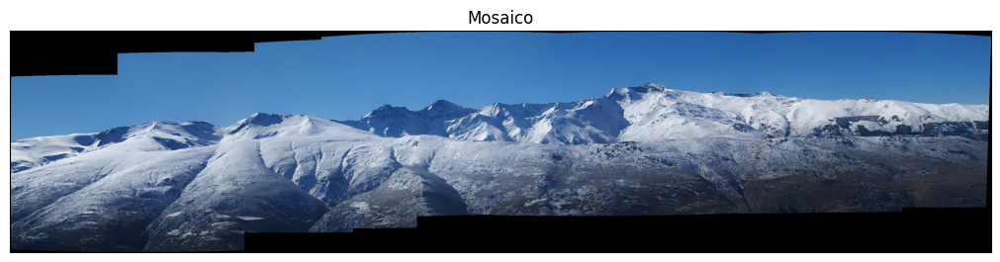

In [ ]:
stitcher = cv2.Stitcher.create() # Creo stitcher
status, panorama = stitcher.stitch(images) # Hago stitching
if status == cv2.Stitcher_OK:
    print("Stitching completed successfully.")
    displayIm(blackOut(panorama), 'Mosaico')
else:
    print(f"Stitching failed with status code {status}")

Vemos como en nuestro caso tenemos una deformación del panorama que crea un efecto 3D, mientras que en el `cv2.Stitcher` obtenemos un panorama más plano. Eso es porque nosotros trabajamos con un modelo de proyección plano, que funciona bien si tenemos una superficie plana, como un mapa grande, pero si tenemos profundidad aparecen distorsiones, como el efecto cóncavo que observamos. En cambio, el `cv2.Stitcher` usa proyecciones esféricas, mapeando las imágenes sobre una superficie esférica y después aplanándola minimizando las distorsiones.